In [1]:
import numpy as np
from numpy import nan
from catboost import CatBoostRegressor, Pool, EFstrType, CatBoostClassifier
import pandas as pd



In [2]:
ex = pd.read_csv('table_ml.csv' )

In [5]:
#ex.loc[ex.tx_day_1_Tocilizumab >= 1].round().T.to_csv('table_ml_example_Tto.csv')
ex.tx_total_days_Tocilizumab.describe()

count    16718.000000
mean         7.819237
std          9.353057
min          0.000000
25%          3.000000
50%          5.000000
75%         10.000000
max        247.000000
Name: tx_total_days_Tocilizumab, dtype: float64

In [12]:
#ex.iloc[:10].round().T.to_csv('table_ml_example.csv')
ex.columns.values

array(['index', '_patient_id', '_health_dep', '_age', '_gender',
       'date_in', 'n_days_in', 'barthel_scale', 'n_covid_rel_dx',
       'covid_rel_dx', 'n_covid_rel_image', 'covid_rel_image', 'n_PCRs_+',
       'n_days_icu', 'sofa_scale', 'glasgow', 'critic', 'severity',
       '_discharge', '1Diabetes', '1Hypertension', '2Diabetes',
       '2Hypertension', 'ARDS', 'Acute_bronchitis', 'Acute_kidney',
       'CNS_cognitive', 'CNS_ischemia', 'Cardiovascular',
       'Covid_respiratory_interst', 'Covid_respiratory_other',
       'Covid_respiratory_pneu', 'Covid_respiratory_pneu_other',
       'Covid_respiratory_upp', 'Cytokine_RS', 'Disseminated_IC',
       'Enteritis', 'Heart_disease', 'Hypogluc_delta', 'Hypogluc_grade',
       'Immunocompromised', 'Inflammatory_R', 'Lipemias', 'Liver',
       'Lung_Embolism', 'Malignancy', 'Renal', 'Respiratory',
       'Second_pneumonia', 'Tobacco', 'Venous_Thrombosis', 'charlson',
       'charlson_sv', 'date_icu_in', 'glasgow_scale', 'height', 'micr

In [4]:
ex.critic = ex.critic.apply(lambda x: 1 if x == True else 0)

In [5]:
ex.date_in = ex.date_in.apply(lambda x: (pd.to_datetime(x) - pd.to_datetime('2020-01-01')).days)

In [6]:
ex.covid_rel_image = ex.n_covid_rel_image.apply(lambda x: 1 if  x >= 1 else 0) 
ex.covid_rel_image.describe()

count    16718.000000
mean         0.306496
std          0.461052
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: covid_rel_image, dtype: float64

In [7]:
ex.micro = ex.micro_delta.apply(lambda x: 1 if  x <=3 else 0) #1 if any cultive + in first 3 days
ex.micro.describe()

count    16718.000000
mean         0.038521
std          0.192457
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: micro, dtype: float64

In [8]:
ex['Hypogluc'] = ex.apply(lambda x: x.Hypogluc_grade if  x.Hypogluc_delta <=3 else 0, axis = 1) #1 if any hypogluc  in first 3 days
ex.Hypogluc.describe()

count    16718.000000
mean         0.003469
std          0.077265
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: Hypogluc, dtype: float64

In [9]:
pd.set_option('display.max_rows', None)
missing_df = pd.DataFrame((ex.isna().sum() * 100)/ ex.shape[0] ).reset_index()
missing_df.columns = ['name', 'perc']
missing_df[missing_df.perc > 60]

,name,perc
14,sofa_scale,99.192487
15,glasgow,100.000000
38,Hypogluc_delta,99.407824
53,date_icu_in,92.289748
54,glasgow_scale,97.045101
55,height,97.457830
58,n_days_to_ICU,92.289748
59,n_days_to_death,85.309248
61,n_days_to_readmission,77.389640
63,weight,95.573633


### Experiment: 
#### Task definition: Predict critic for each admission in covid admissions) using ONLY features obtained in the first 3 days of admission and removing who scale in first 3 days

In [10]:
covid_adm = ex[( (ex['n_PCRs_+'] > 0) & ((ex['n_covid_rel_dx'] > 0) | (ex['n_covid_rel_image'] > 0) )) | ((ex.Covid_pneumonia == 1) | (ex.Cytokine_RS == 1) | (ex.Inflammatory_R == 1)) ] #added dx of covid pneumonia without microbiological confirmation
non_covid_adm = ex.index.isin(covid_adm.index) == False



In [11]:

test = ex.loc[ex.index.isin(covid_adm.index) & (ex._health_dep == 17)]
ex = ex.loc[ex.index.isin(covid_adm.index) & (ex._health_dep != 17)]
print(ex.shape, test.shape)

(7055, 650) (1101, 650)


In [18]:
substring_list = ['_mean_', '_bin_', '_n_', '_total_' , 'delta']
leak_temp = [x for x in ex.columns.values if x.startswith('n_') or any(substring in x for substring in substring_list)]
leak_temp

['n_days_in',
 'n_covid_rel_dx',
 'n_covid_rel_image',
 'n_PCRs_+',
 'n_days_icu',
 'Hypogluc_delta',
 'n_PCRs',
 'n_days_to_ICU',
 'n_days_to_death',
 'n_days_to_lastFU',
 'n_days_to_readmission',
 'n_image',
 'tx_bin_Anakinra',
 'tx_dose_total_Anakinra',
 'tx_delta_init_Anakinra',
 'tx_total_days_Anakinra',
 'tx_bin_Azitromicina',
 'tx_dose_total_Azitromicina',
 'tx_delta_init_Azitromicina',
 'tx_total_days_Azitromicina',
 'tx_bin_Baricitinib',
 'tx_dose_total_Baricitinib',
 'tx_delta_init_Baricitinib',
 'tx_total_days_Baricitinib',
 'tx_bin_Bemiparina',
 'tx_dose_total_Bemiparina',
 'tx_delta_init_Bemiparina',
 'tx_total_days_Bemiparina',
 'tx_bin_Ciclosporina',
 'tx_dose_total_Ciclosporina',
 'tx_delta_init_Ciclosporina',
 'tx_total_days_Ciclosporina',
 'tx_bin_Cloroquina',
 'tx_dose_total_Cloroquina',
 'tx_delta_init_Cloroquina',
 'tx_total_days_Cloroquina',
 'tx_dose_total_Corticoides',
 'tx_delta_init_Corticoides',
 'tx_total_days_Corticoides',
 'tx_bin_Darunavir_cobicistat',
 '

In [19]:
complications = ['Covid_rel_dx_binary', 'ARDS', 'Acute_bronchitis', 'Acute_kidney', 'Covid_pneumonia','CNS_cognitive', 'CNS_ischemia',
                'Cytokine_RS','Disseminated_IC', 'Enteritis', 'Heart_disease',
                 'Inflammatory_R', 'Lung_Embolism', 'Second_pneumonia','Venous_Thrombosis', 
                 'Covid_respiratory_interst', 'Covid_respiratory_other',
       'Covid_respiratory_pneu', 'Covid_respiratory_pneu_other',
       'Covid_respiratory_upp']


In [20]:
substring_list = ['critic','who', 'severity', 'dischar', 'survival', 'dead', 'readmi', '_patient_id', 'covid_rel_dx', ]
outcomes = [x for x in ex.columns.values if any(substring in x for substring in substring_list)]
outcomes

['_patient_id',
 'n_covid_rel_dx',
 'covid_rel_dx',
 'critic',
 'severity',
 '_discharge',
 'n_days_to_readmission',
 'dead',
 'survival',
 'readmission',
 'readmission_free_survival',
 'who_bin',
 'who_mean',
 'who_day_1',
 'who_day_2',
 'who_day_3',
 'who_day_4',
 'who_day_5',
 'who_day_6',
 'who_day_7',
 'who_day_14',
 'who_day_28',
 'who_last',
 'who_worst']

In [21]:
substring_list = ['glasgow','sofa', 'icu']
icu = [x for x in ex.columns.values if any(substring in x for substring in substring_list)]
icu

['n_days_icu', 'sofa_scale', 'glasgow', 'date_icu_in', 'glasgow_scale']

In [22]:

x_vars = list(set(ex.columns.values) - set(icu)  - set(complications) - set(outcomes) - set(leak_temp))
x_vars.sort()
x_vars

['1Diabetes',
 '1Hypertension',
 '2Diabetes',
 '2Hypertension',
 'Cardiovascular',
 'Hypogluc',
 'Hypogluc_grade',
 'Immunocompromised',
 'Lipemias',
 'Liver',
 'Malignancy',
 'Renal',
 'Respiratory',
 'Tobacco',
 '_age',
 '_gender',
 '_health_dep',
 'barthel_scale',
 'charlson',
 'charlson_sv',
 'covid_rel_image',
 'cx_res_basal_SF_ratio',
 'cx_res_basal_fiO2',
 'cx_res_basal_resp_rate',
 'cx_res_basal_satO2',
 'cx_res_day_1_SF_ratio',
 'cx_res_day_1_fiO2',
 'cx_res_day_1_resp_rate',
 'cx_res_day_1_satO2',
 'cx_res_day_2_SF_ratio',
 'cx_res_day_2_fiO2',
 'cx_res_day_2_resp_rate',
 'cx_res_day_2_satO2',
 'cx_res_day_3_SF_ratio',
 'cx_res_day_3_fiO2',
 'cx_res_day_3_resp_rate',
 'cx_res_day_3_satO2',
 'date_in',
 'height',
 'index',
 'lab_basal_25',
 'lab_basal_ALB',
 'lab_basal_B',
 'lab_basal_BNP',
 'lab_basal_Bic',
 'lab_basal_Bil',
 'lab_basal_CAL',
 'lab_basal_CLO',
 'lab_basal_CO2',
 'lab_basal_CPK',
 'lab_basal_Cre',
 'lab_basal_Dim',
 'lab_basal_ERI',
 'lab_basal_Exc',
 'lab_bas

In [23]:
y_vars = ['critic']


In [24]:


x_vars.index('_gender')

15

In [25]:
X = ex[x_vars]

y = ex[y_vars].values
X_test = test[x_vars]
y_test = test[y_vars].values

In [26]:
X.shape, y.shape

((7055, 360), (7055, 1))

In [27]:
y_test.mean(), y.mean()

(0.2761126248864669, 0.30857547838412475)

### Cross Validation

In [28]:
from catboost import cv

In [29]:
cv_dataset = Pool(data = X, 
                 label = y,
                 cat_features=['_gender'])

In [30]:
params = {"iterations": 200,
          "depth": 6,
          'learning_rate' : 0.3,
          "loss_function": "CrossEntropy",
          "eval_metric": "AUC",
          "verbose": False}

In [31]:
scores = cv(cv_dataset,
            params,
            fold_count=10, 
            plot="True")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

### Non- CV - Best Model

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.20, random_state=42)

In [33]:
#initialize Pool
train_pool = Pool(X_train, 
                  y_train, 
                  cat_features=['_gender'])
val_pool = Pool(X_val, 
                y_val, 
                cat_features=['_gender'])
test_pool = Pool(X_test, 
                 y_test,
                 cat_features=['_gender']) 


In [34]:
# specify the training parameters 
model = CatBoostClassifier(depth=6, 
                          iterations = 200,
                          learning_rate=0.3, 
                          loss_function='CrossEntropy', 
                          eval_metric='AUC'
                          )
#train the model
#early_stopping_rounds=20, 
model.fit(train_pool, eval_set=val_pool, plot = True, verbose = False, use_best_model=True)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [35]:
print(model.get_best_iteration())

153


In [36]:
print(model.get_all_params())
best_score = model.get_best_score()
print(best_score)
best_score['validation']['AUC']
auc = best_score['validation']['AUC']

{'nan_mode': 'Min', 'eval_metric': 'AUC', 'combinations_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1', 'Counter:CtrBorderCount=15:CtrBorderType=Uniform:Prior=0/1'], 'iterations': 200, 'sampling_frequency': 'PerTree', 'fold_permutation_block': 0, 'leaf_estimation_method': 'Newton', 'counter_calc_method': 'SkipTest', 'grow_policy': 'SymmetricTree', 'penalties_coefficient': 1, 'boosting_type': 'Plain', 'model_shrink_mode': 'Constant', 'feature_border_type': 'GreedyLogSum', 'ctr_leaf_count_limit': 18446744073709551615, 'bayesian_matrix_reg': 0.10000000149011612, 'one_hot_max_size': 2, 'l2_leaf_reg': 3, 'random_strength': 1, 'rsm': 1, 'boost_from_average': False, 'max_ctr_complexity': 4, 'model_size_reg': 0.5, 'simple_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1', 'Counter:CtrBorderCount=15:CtrBorderType=Uniform

In [38]:

model.save_model(f'ex_0_dry_AUC={auc}',
           format="cbm",
           export_parameters=None,
           pool=train_pool)

In [39]:
p_val = model.predict(val_pool, 
        prediction_type='Probability',
        ntree_start=0, 
        ntree_end=0, 
        thread_count=-1,
        verbose=None)

In [40]:
list(zip(y_val,p_val))

[(array([0]), array([0.15963619, 0.84036381])),
 (array([1]), array([0.50354689, 0.49645311])),
 (array([1]), array([3.72380145e-04, 9.99627620e-01])),
 (array([0]), array([0.98069817, 0.01930183])),
 (array([0]), array([0.95572349, 0.04427651])),
 (array([0]), array([0.90688653, 0.09311347])),
 (array([0]), array([0.56875856, 0.43124144])),
 (array([0]), array([0.36058976, 0.63941024])),
 (array([0]), array([0.99499492, 0.00500508])),
 (array([0]), array([0.98606245, 0.01393755])),
 (array([1]), array([0.93661883, 0.06338117])),
 (array([0]), array([0.93456392, 0.06543608])),
 (array([0]), array([0.94590692, 0.05409308])),
 (array([0]), array([0.98869418, 0.01130582])),
 (array([0]), array([0.94647636, 0.05352364])),
 (array([0]), array([0.98198822, 0.01801178])),
 (array([0]), array([0.72976033, 0.27023967])),
 (array([1]), array([0.06435681, 0.93564319])),
 (array([1]), array([0.00850034, 0.99149966])),
 (array([0]), array([0.90580507, 0.09419493])),
 (array([0]), array([0.52860807,

In [41]:
p_test = model.predict(test_pool, 
        prediction_type='Probability',
        ntree_start=0, 
        ntree_end=0, 
        thread_count=-1,
        verbose=None)

In [42]:
p_test[:,1]

array([0.02275962, 0.01015283, 0.02430394, ..., 0.10927373, 0.00461877,
       0.86928944])

In [43]:
list(zip(y_test,p_test))

[(array([0]), array([0.97724038, 0.02275962])),
 (array([0]), array([0.98984717, 0.01015283])),
 (array([0]), array([0.97569606, 0.02430394])),
 (array([0]), array([0.86397245, 0.13602755])),
 (array([0]), array([0.94285597, 0.05714403])),
 (array([0]), array([0.99602651, 0.00397349])),
 (array([1]), array([0.80472466, 0.19527534])),
 (array([0]), array([0.55042068, 0.44957932])),
 (array([1]), array([0.90629034, 0.09370966])),
 (array([0]), array([0.79560775, 0.20439225])),
 (array([0]), array([0.46138786, 0.53861214])),
 (array([0]), array([0.62437064, 0.37562936])),
 (array([1]), array([0.51047423, 0.48952577])),
 (array([0]), array([0.9282876, 0.0717124])),
 (array([0]), array([0.2170429, 0.7829571])),
 (array([0]), array([0.93256828, 0.06743172])),
 (array([0]), array([0.90417713, 0.09582287])),
 (array([0]), array([0.93711066, 0.06288934])),
 (array([0]), array([0.94228386, 0.05771614])),
 (array([0]), array([0.50073154, 0.49926846])),
 (array([0]), array([0.85235934, 0.14764066]

In [44]:
from catboost.utils import eval_metric
from math import log

labels = y_test[:,0]
print(labels.shape)
probabilities = p_test[:,1]
print(probabilities.shape)

val = False
if val:
    labels = y_val[:,0]

    probabilities = p_val[:,1]


# In binary classification it is necessary to apply the logit function
# to the probabilities to get approxes.

logit = lambda x: log(x / (1 - x))
approxes = list(map(logit, probabilities))

accuracy = eval_metric(labels, approxes, 'AUC')
accuracy

(1101,)
(1101,)


[0.853653503268837]

In [45]:
importances = model.get_feature_importance(data=None,
                       type=EFstrType.FeatureImportance,
                       prettified=True,
                       thread_count=-1,
                       verbose=False)

In [46]:
importances[:50]

,Feature Id,Importances
0,cx_res_day_2_fiO2,6.636162
1,cx_res_day_3_fiO2,4.477010
2,vs_day_3_tem,3.873709
3,date_in,3.829406
4,cx_res_day_3_satO2,2.821820
5,cx_res_day_3_SF_ratio,2.795585
6,_age,2.142576
7,charlson_sv,1.988417
8,lab_day_3_NLR,1.540989
9,cx_res_day_2_satO2,1.518688


In [47]:
import shap

In [48]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(model)
shap_values = explainer(X)

In [49]:
shap_values

.values =
array([[ 0.00000000e+00,  1.23753938e-02, -6.64993678e-03, ...,
        -6.71597121e-02, -1.98068674e-01,  4.16587146e-04],
       [ 0.00000000e+00, -2.78919427e-02,  5.75562278e-03, ...,
        -3.91691967e-02,  5.34348800e-01,  2.66085970e-03],
       [ 0.00000000e+00, -3.51007447e-03,  8.77668810e-03, ...,
         1.15685162e-01, -1.93342986e-01,  1.72149817e-03],
       ...,
       [ 0.00000000e+00, -2.78919427e-02,  1.62540797e-02, ...,
        -3.13284947e-02,  2.76676636e-02,  4.16587146e-04],
       [ 0.00000000e+00, -1.80200004e-02,  1.62540797e-02, ...,
        -1.18924794e-01,  7.50590416e-01,  4.16587146e-04],
       [ 0.00000000e+00,  5.29816903e-03, -6.64993678e-03, ...,
         1.76370855e-02, -3.37695064e-01,  2.66085970e-03]])

.base_values =
array([-1.43738672, -1.43738672, -1.43738672, ..., -1.43738672,
       -1.43738672, -1.43738672])

.data =
array([[0.0, 0.0, 0.0, ..., 106.0, 36.4, nan],
       [0.0, 0.0, 0.0, ..., 123.0, 38.6, nan],
       [0.0, 0.0

In [50]:
y[10]

array([0])

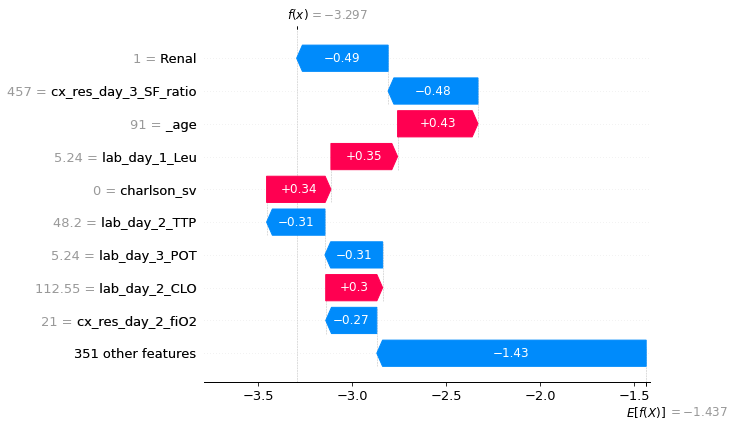

In [51]:
# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[10])

In [52]:
# visualize the first prediction's explanation with a force plot
shap.initjs()
shap.plots.force(shap_values[10])

In [53]:
# visualize the first prediction's explanation with a force plot
shap.initjs()
shap.plots.force(shap_values[22])

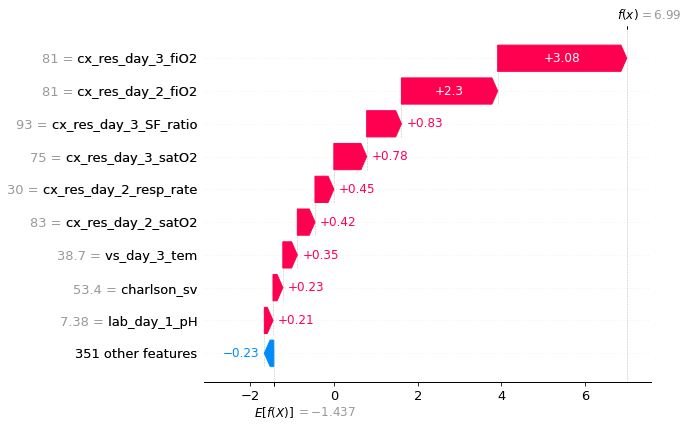

In [54]:
shap.plots.waterfall(shap_values[22])

In [55]:
pd.DataFrame( {'feature' : X.columns.values, 'value' : shap_values[10].data})

,feature,value
0,1Diabetes,0.0
1,1Hypertension,1.0
2,2Diabetes,0.0
3,2Hypertension,0.0
4,Cardiovascular,0.0
5,Hypogluc,0.0
6,Hypogluc_grade,0.0
7,Immunocompromised,0.0
8,Lipemias,0.0
9,Liver,0.0


In [56]:
# visualize all the training set predictions
shap.initjs()
shap.plots.force(explainer.expected_value, shap_values.values[:500], feature_names = X.columns)

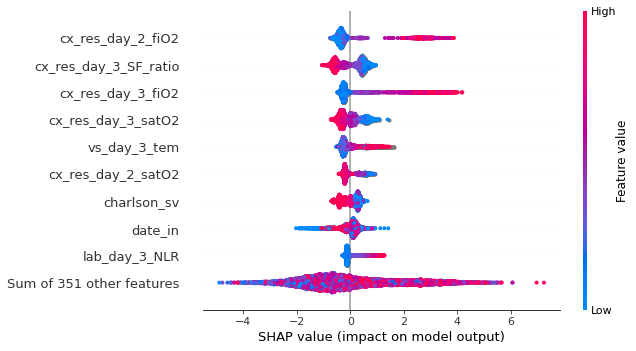

In [57]:
shap.plots.beeswarm(shap_values)

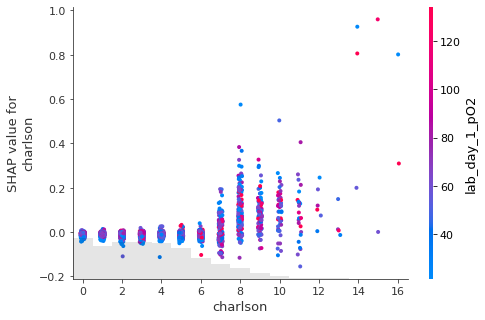

In [58]:
# create a dependence scatter plot to show the effect of a single feature across the whole dataset
shap.initjs()
shap.plots.scatter(shap_values[:,'charlson'], color=shap_values)

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


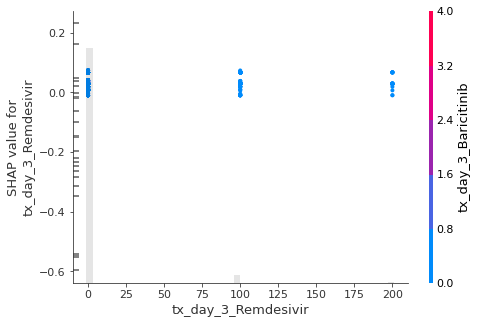

In [81]:
shap.plots.scatter(shap_values[:,'tx_day_3_Remdesivir'], color=shap_values)

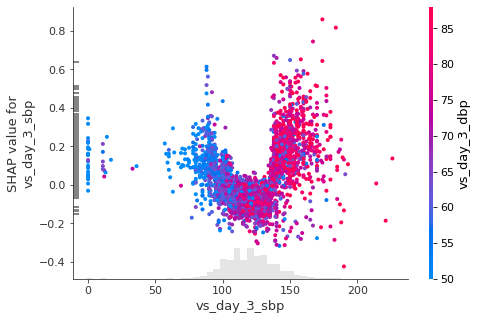

In [82]:
shap.plots.scatter(shap_values[:,'vs_day_3_sbp'], color=shap_values)

invalid value encountered in subtract


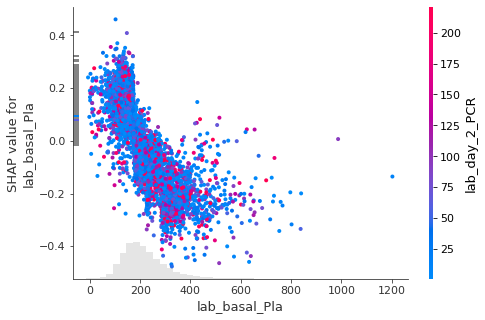

In [83]:
# lab_basal_Pla
shap.plots.scatter(shap_values[:,'lab_basal_Pla'], color=shap_values)

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


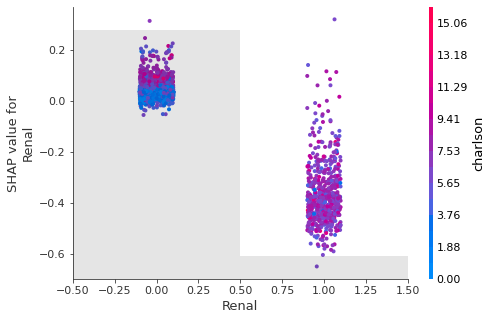

In [86]:
shap.plots.scatter(shap_values[:,'Renal'], color=shap_values)

invalid value encountered in subtract


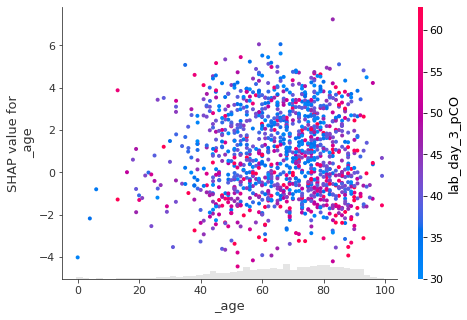

In [60]:
shap.plots.scatter(shap_values[:,'_age'], color=shap_values)

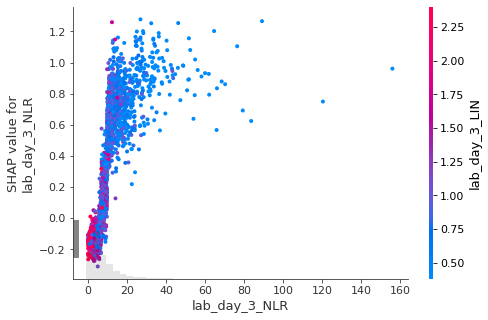

In [61]:
shap.plots.scatter(shap_values[:,'lab_day_3_NLR'], color=shap_values)

invalid value encountered in subtract


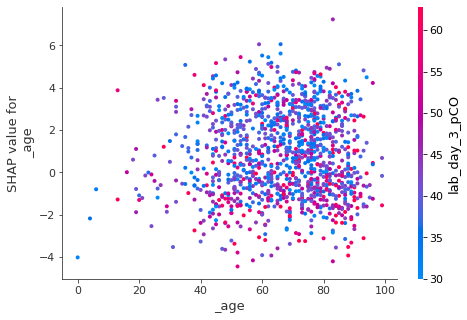

In [62]:
shap.dependence_plot("_age", shap_values.values, X)

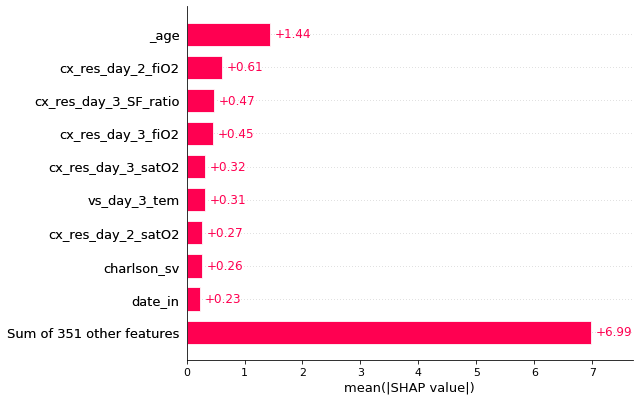

In [63]:
shap.plots.bar(shap_values)

In [64]:
interactions = model.get_feature_importance(data=None,
                       type=EFstrType.Interaction,
                       prettified=True,
                       thread_count=-1,
                       verbose=False)

In [65]:
interactions['First Feature'] = interactions['First Feature Index'].apply(lambda x: x_vars[x])
interactions['Second Feature'] = interactions['Second Feature Index'].apply(lambda x: x_vars[x])

In [66]:
interactions[['First Feature', 'Second Feature', 'Interaction']].iloc[:33]

,First Feature,Second Feature,Interaction
0,date_in,lab_day_3_SOD,0.371119
1,cx_res_day_2_fiO2,cx_res_day_3_SF_ratio,0.334731
2,cx_res_day_3_fiO2,tx_day_2_Tiamina_vitamina_B1,0.333618
3,date_in,lab_day_2_GLU,0.332964
4,_age,date_in,0.331835
5,cx_res_day_2_fiO2,lab_day_3_NLR,0.322948
6,cx_res_day_2_fiO2,cx_res_day_3_fiO2,0.285355
7,lab_day_2_Fib,tx_day_3_Remdesivir,0.246518
8,date_in,tx_day_3_Lopinavir_ritonavir,0.241939
9,cx_res_day_2_fiO2,tx_day_2_Tiamina_vitamina_B1,0.241289


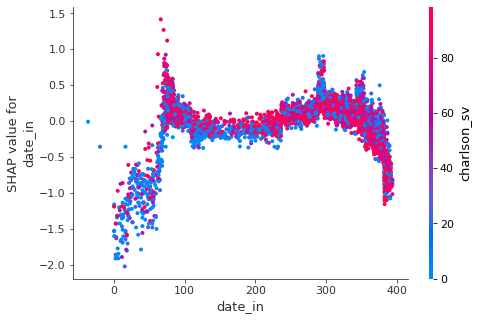

In [67]:
shap.dependence_plot("date_in", shap_values.values, X, interaction_index= 'charlson_sv')

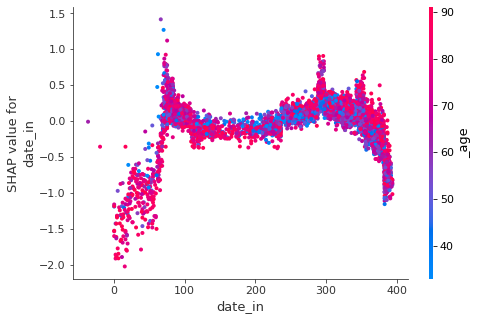

In [72]:
shap.dependence_plot("date_in", shap_values.values, X, interaction_index= '_age')

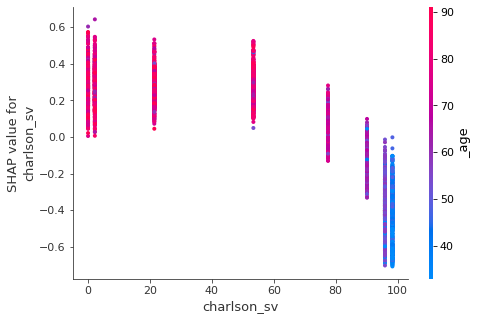

In [73]:
shap.dependence_plot("charlson_sv", shap_values.values, X, interaction_index= '_age')

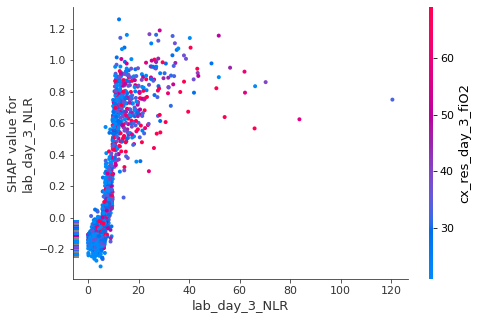

In [75]:
shap.dependence_plot("lab_day_3_NLR", shap_values.values, X, interaction_index= 'cx_res_day_3_fiO2')

from pathlib import Path
path_rx = Path('../Rx-thorax-automatic-captioning')
img_labels = pd.read_csv(path_rx /'Labels_covid_pharma.csv')[['PatientID','ReportID','Report','Labels', 'LabelsLocalizationsBySentence', 'labelCUIS', 'LocalizationsCUIS']]
img_labels['_health_dep'] = img_labels.ReportID.apply(lambda x: x.split('_')[0])
img_labels['_date'] = img_labels.ReportID.apply(lambda x: x.split('_')[-1])
img_labels['_modality'] = img_labels.ReportID.apply(lambda x: x.split('_')[-2])
img_labels.drop(columns = ['ReportID'], inplace = True)

img_labels[img_labels._health_dep == '20'].to_csv('Rx_20.csv', index = False)


img_labels[img_labels._health_dep == '20'].shape